# Butterfly Scale Spectral Analysis
------
## Problem Statement
Butterfly wings consist of many unique patterns and colours that are the result of a long history of selective evolutionary pressures. The cause of these patterns and colours is more complex than these wings simply absorbing and reflecting different wavelengths of light. Butterfly wings consists of multiple layers of scales, each of which consists of unique nano-scale (pun not intended) structures that cause the light incident on its surface to undergo diffraction, diffusion and other interference effects which results in unique interplay between various wavelengths of light that cause the colours and patterns seen on butterfly wings.

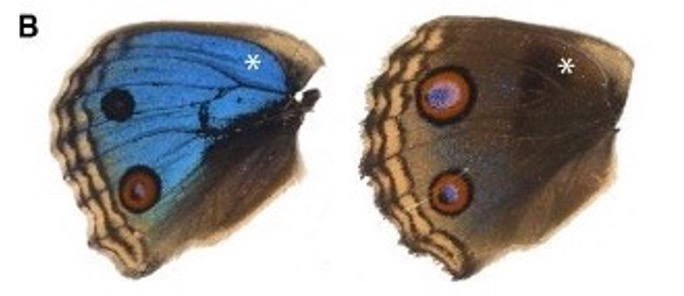

Since the colours of a butterfly’s wings are dependent on how the nanostructures of the butterfly’s scales manipulate light, an exact understanding of how these nanostructures do so requires information not just of its 3D structure, but also of the scale’s material’s densities and refractive indices. A basic start to understanding the material's densities and refractive indices, we would need a better understanding of the chemical composition found in the scales. We could do this with the aid of spectro-ptychography.

--------------
# Task 0: Import Necessary Packages

In [3]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# YOUR TURN: Include the other packages you intend to use
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects
from skimage.measure import label, regionprops
from scipy.signal import savgol_filter

-------

# Task 1: Loading the data and some simple EDA
Firstly, when given a h5 file, it is usually a good idea to check its contents first. Run the code below to see the contents of ```bicyclus_wt_carbon.h5```.

In [4]:
# A function like this helps us list all the contents in a h5 file!
def display_h5_hierarchy(g, indent=0):
    """
    Recursively prints the hierarchy of an HDF5 group or file, including shape and dtype of datasets.
    """
    for key in g:
        item = g[key]
        if isinstance(item, h5py.Group):
            print('  ' * indent + f"- {key}/ [Group]")
            display_h5_hierarchy(item, indent + 1)
        elif isinstance(item, h5py.Dataset):
            print('  ' * indent + f"- {key} [Dataset] shape={item.shape}, dtype={item.dtype}")

In [5]:
# YOUR TURN: Input the file name of the h5 file below!
h5_filename = "./bicyclus_mut_c.h5"
# h5_filename = None # e.g. "./bicyclus_wt_c.h5" or "./bicyclus_mut_c.h5"

#teacher
with h5py.File(h5_filename, "r") as f: 
# with h5py.File("./bicyclus_wt_carbon.h5", "r") as f:
    keys = display_h5_hierarchy(f)

- amplitude [Dataset] shape=(77, 350, 350), dtype=float32
- energy_ev [Dataset] shape=(77,), dtype=float32
- phase [Dataset] shape=(77, 350, 350), dtype=float32


You should notice from above the there are 3 arrays found in your h5 file.

```energy_ev``` contains the values are in eV (electron volts) and each element of this array represents a value of X-ray energy at which a ptychographic scan was conducted.

```amplitude``` contains the amplitude values of each scan conducted at each of the energy values. 

```phase``` contains the phase value of each scan conducted at each of the energy values.

Next, we need to import over the spectral data of the butterfly scale. Run the code below to import the data.

In [6]:
with h5py.File(h5_filename, "r") as f:
    phase_im = np.asarray(f["phase"]) # I have chosen to call this variable phase_im as it contains 'images' of the phases
    amplitude_im = np.asarray(f["amplitude"]) # Similar idea for amplitude_im
    energy = np.asarray(f["energy_ev"])

Let's explore this dataset! We should first check what energy values the scans were conducted for. Let print them out below

In [7]:
print(energy)
# print(phase_im)
# print(amplitude_im)

[278.  279.  280.  281.  282.  283.  283.2 283.4 283.6 283.8 284.  284.2
 284.4 284.6 284.8 285.  285.2 285.4 285.6 285.8 286.  286.2 286.4 286.6
 286.8 287.  287.2 287.4 287.6 287.8 288.  288.2 288.4 288.6 288.8 289.
 289.2 289.4 289.6 289.8 290.  290.2 290.4 290.6 290.8 291.  291.2 291.4
 291.6 291.8 292.  292.2 292.4 292.6 292.8 293.  293.2 293.4 293.6 293.8
 294.  295.  296.  297.  298.  299.  300.  301.  302.  303.  304.  305.
 306.  307.  308.  309.  310. ]


Next, let understand the entries of ```amplitude_im``` and ```phase_im```. We can plot out the amplitudes and the phases for a given energy value using the code below.

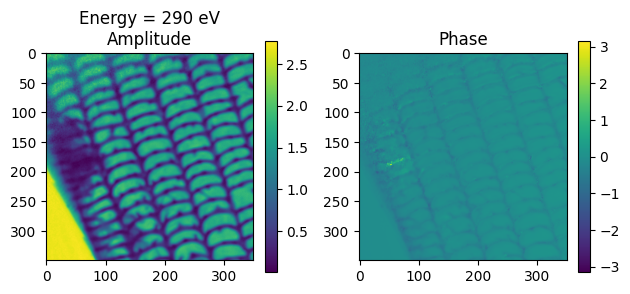

In [8]:
chosen_energy = 290  # YOUR TURN: Play around by adjusting this number to any other energy value found above.

######----- DO NOT EDIT THIS PART -----######
energy_ind = np.where(energy == chosen_energy)[0][0]
amplitude_to_show, phase_to_show = amplitude_im[energy_ind], phase_im[energy_ind]

fig, axes = plt.subplots(1, 2, dpi = 100)
amp = axes[0].imshow(amplitude_to_show)
axes[0].set_title(f'Energy = {chosen_energy} eV\nAmplitude')
plt.colorbar(mappable = amp, fraction = 0.05)

pha = axes[1].imshow(phase_to_show, vmin = -np.pi, vmax = np.pi)
axes[1].set_title('\nPhase')
plt.colorbar(mappable = pha, fraction = 0.05)

plt.tight_layout()
######----- DO NOT EDIT THIS PART -----######

###### DO NOT EDIT THIS PART ######
#know amplitude
#find phase


In [9]:
amplitude_im.shape

(77, 350, 350)

Once you have understood that each entry along the 0-th axis for ```amplitude_im``` and ```phase_im``` correspond to an energy in ```energy```, we are now ready to see how the chemical spectra of each pixel can be obtained. Simply by aligning all reconstructed image together, we can plot out the pixel intensity for each energy to obtain a chemical spectra! Experiment with the code below to see it yourself.

Text(0, 0.5, 'Phase')

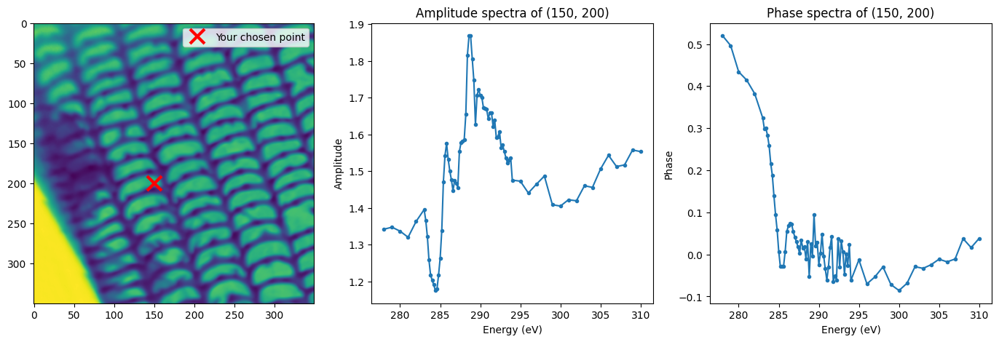

In [10]:
# ---- COORDINATE SYSTEM ----
# Increasing x: Rightwards
# Increasing y: Downwards

x_loc, y_loc = 150, 200 # YOUR TURN: Adjust these values to explore the spectra

fig, axes = plt.subplots(1, 3, dpi = 100, figsize = (17, 5))
axes[0].imshow(amplitude_im.mean(axis = 0))
axes[0].plot(x_loc, y_loc, 'x', color = 'r', markersize = 15, markeredgewidth = 3, label = 'Your chosen point')
axes[0].legend()

axes[1].plot(energy, amplitude_im[:, x_loc, y_loc], '.-')
axes[1].set_title(f'Amplitude spectra of {(x_loc, y_loc)}')
axes[1].set_xlabel('Energy (eV)')
axes[1].set_ylabel('Amplitude')

axes[2].plot(energy, phase_im[:, x_loc, y_loc], '.-')
axes[2].set_title(f'Phase spectra of {(x_loc, y_loc)}')
axes[2].set_xlabel('Energy (eV)')
axes[2].set_ylabel('Phase')



# # ---- COORDINATE SYSTEM ----
# # Increasing x: Downwards
# # Increasing y: Rightwards

# # x_loc, y_loc = 100, 300 # YOUR TURN: Adjust these values to explore the spectra 100,300
# # x_loc, y_loc = 100, 200
# # x_loc, y_loc = 500, 450
# # x_loc, y_loc = 262, 546

# # 你的体数据是 (E, H, W)（能量, y, x）
# # but there is (E, H, W)（能量, y, x）
# chosen_spectra = amplitude_im[:, x_loc, y_loc]
# # chosen_spectra = amplitude_im[:, y_loc, x_loc]

# fig, axes = plt.subplots(1, 2, dpi = 100, figsize = (12, 5))
# axes[0].plot(chosen_spectra, '.-')
# axes[0].set_title(f'Chemical spectra of {(x_loc, y_loc)}')

# axes[1].imshow(amplitude_im.mean(axis = 0))
# axes[1].plot(x_loc, y_loc, 'x', color = 'r', markersize = 15, markeredgewidth = 3, label = 'Your chosen point')
# axes[1].legend()

Let spend some time to appreciate the physics of what we are seeing above. When X-rays of a given energy are incident on the sample, the wave that ends up reaching the detector would be given by

\begin{align*}
\psi = A(E, x, y) e^{i\theta(E, x, y)}
\end{align*}

Where $A(E, x, y)$ represents the amplitude of the wave and $\theta (E, x, y)$ represents the phase of the wave for a given energy $E$ and at a position $(x, y)$. Note that $e$ is Euler's number ($e \equiv 2.71828...$) and $i \equiv \sqrt{-1}$.

--------------
## TASK 2: Background Removal

The scans we currently have do not only contain the signatures of the scale. It contains the signatures of the background as well. Hence, we need to remove the background signal to obtain information soley from the scale. In the dataset, there is region where only a background is present and the scale is not (the red region in the image below)!

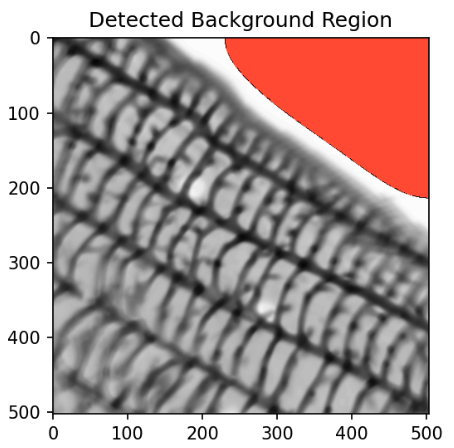

**Firstly**, understand the difference between absorbance, intensity and amplitude. Learn how they relate to each other.

**Second**, figure out how to obtain average absorbance and phase spectra of this background region. You should obtain something like this:

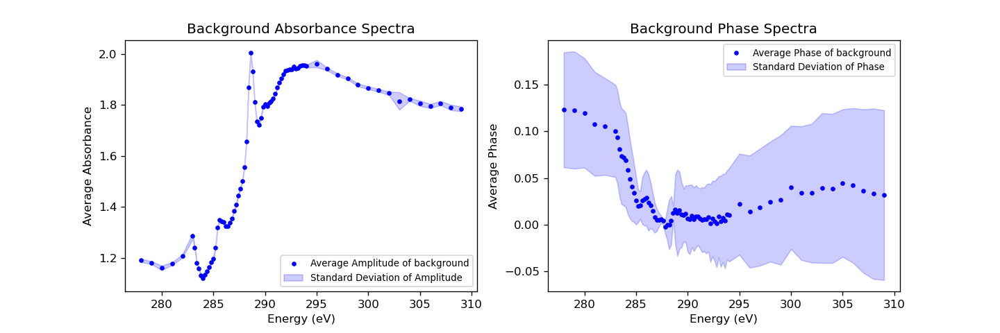

Finally, remove the background spectrum from all spectra. Use the information below to aid you in how you should remove the background absorbance and the phase spectra.

**Subtracting Background Amplitudes**

The (Naperian) absorbance, $\tau$ is given by

\begin{align*}
\tau = \ln \left(\frac{I_0}{I} \right)
\end{align*}

From Beer-Lambert's law, it is known that the intensity of the wave decreases in accordance to the equation below

\begin{align*}
I &= I_0 e^{- \mu(x) x}\\
\frac{I_0}{I} &= e^{\mu(x) x}\\
\tau &= \mu(x) x
\end{align*}

Hence, for a region where the X-rays only pass through the background (of thickness $\Delta x$)

\begin{align*}
I_\text{background} (E) = I_0 (E) e^{- \mu_\text{background}(E) \Delta x} 
\end{align*}

For a region where the X-rays pass through the scale AND the background,

\begin{align*}
I(E,x) = I_0 (E) e^{- \mu_\text{scale}(E, x) x} e^{- \mu_\text{background} \Delta x}
\end{align*}

Hence, to get the intensity variations just due to the scale,

\begin{align*}
I_\text{scale} (E, x) &= I_0 \frac{I}{I_\text{background}}\\
&= I_0 e^{- \mu_\text{scale}(E,x) x}
\end{align*}

The intensity of a wave is related to its amplitude according to

\begin{align*}
I &\propto A^2\\
\Rightarrow I &= kA^2
\end{align*}

Hence, we get that

\begin{align*}
\frac{I(E)}{I_\text{background}(E)} &= \frac{k(E) A(E)^2}{k(E) A_\text{background}(E)^2}\\
&= \frac{A(E)^2}{A_\text{background}(E)^2}
\end{align*}

We thus get
\begin{align*}
I_\text{scale} (E) &= I_0 \frac{A(E)^2}{A_\text{background}(E)^2}\\
\frac{I_0 (E)}{I_\text{scale} (E)} &= \frac{A_\text{background}(E)^2}{A(E)^2}\\
\tau(E) &= 2 \ln \left(\frac{A_\text{background}(E)}{A(E)} \right)
\end{align*}

**Subtracting Background Phases**

Phase contributions from the background would simply add a phase shift. Hence,

\begin{align*}
\theta (E, x, y) = \theta_\text{scale} (E, x, y) + \theta_\text{Background}
\end{align*}

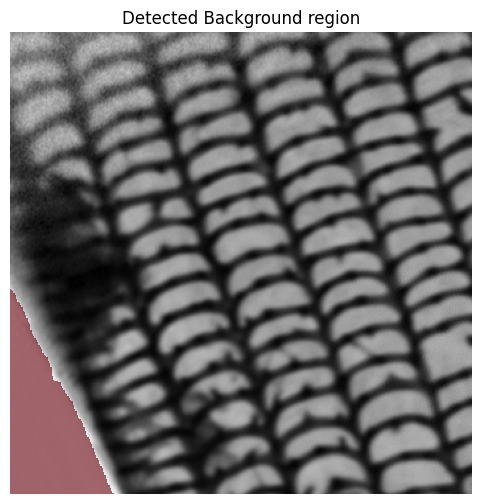

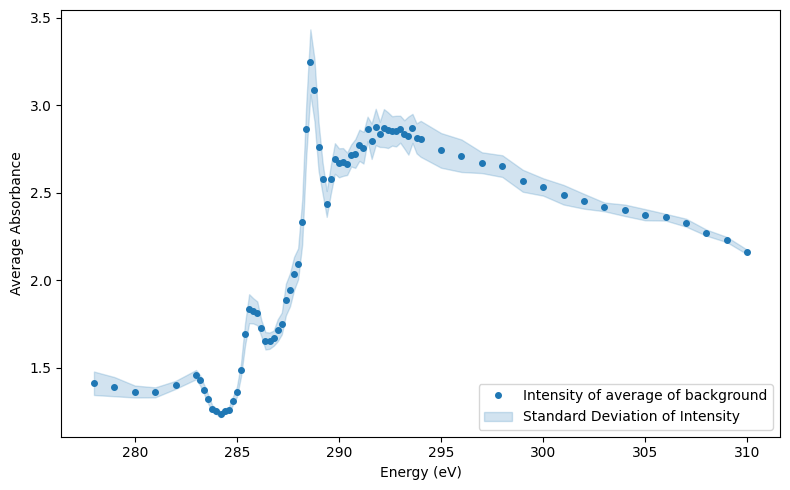

In [11]:
# YOUR TURN!
from skimage.morphology import erosion, disk

# 先挑某个能量切片（比如 290 eV）来生成背景 mask
chosen_energy = 290
energy_ind = np.where(energy == chosen_energy)[0][0]
img = amplitude_im[energy_ind]   # 只用 290 eV 这层来分割背景

# Step 1: 二值化
th = 1.6
bg_mask = img >= th
# print ('img:', img)

# Step 2: 去小噪点 + 腐蚀
bg_mask = remove_small_objects(bg_mask, min_size=1000)
bg_mask = erosion(bg_mask, disk(5))
# print("mask:", bg_mask)


# # Step 3: 可视化
plt.figure(figsize=(6,6))
plt.imshow(img, cmap="gray")  # 原始灰度图
plt.imshow(np.ma.masked_where(~bg_mask, bg_mask), 
           cmap="Reds", alpha=0.6, vmin = 0, vmax = 1)  # 红色只覆盖 mask 区域
# plt.imshow(bg_mask.astype(np.uint8), cmap=cmap_red, vmin=0, vmax=1, interpolation='nearest')
plt.title("Detected Background region")
plt.axis("off")
plt.show()

# Step 4: 对每个能量切片求“背景平均值” → 背景光谱
# 背景均值与标准差（逐能量）
# background amplitude mean
bg_mean = amplitude_im[:, bg_mask].mean(axis=1)                 # (E,)
# print(bg_mean.shape)
bg_std  = amplitude_im[:, bg_mask].std(axis=1, ddof=1)          # (E,)

# A_{\text{bg}}(E)：可以用你算的 bg_mean（背景区域均值）作为参考；
# 是强度谱，不是吸收谱

# 画“平均强度”+“标准差阴影”
plt.figure(figsize=(8,5))
plt.plot(energy, bg_mean, 'o', ms=4, color='tab:blue',
         label='Intensity of average of background')
plt.fill_between(energy, bg_mean - bg_std, bg_mean + bg_std,
                 color='tab:blue', alpha=0.2,
                 label='Standard Deviation of Intensity')

plt.xlabel('Energy (eV)')
plt.ylabel('Average Absorbance')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()

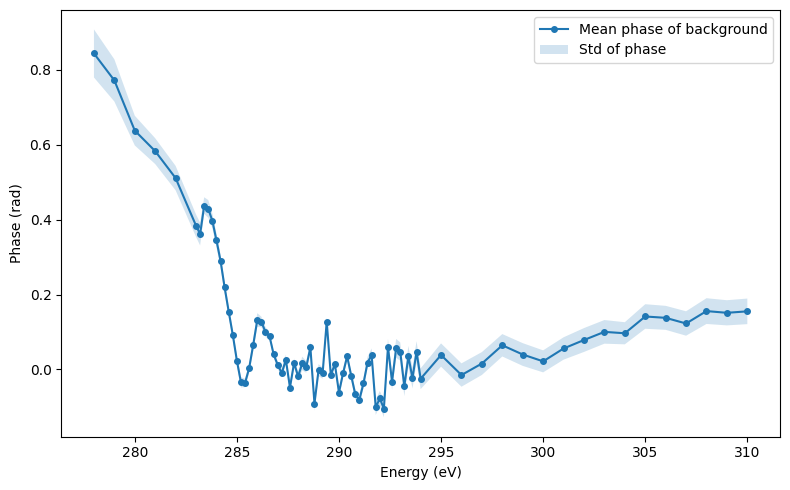

In [12]:
bg_phase = phase_im[:, bg_mask]   # (E, N_bg)
# 圆统计：平均相位
phase_bg_mean = np.angle(np.mean(np.exp(1j * bg_phase), axis=1))   # (E,)
# 圆统计：标准差（先减去平均相位再 wrap 回 [-pi, pi)）
phase_dev = np.angle(np.exp(1j * (bg_phase - phase_bg_mean[:, None])))
phase_bg_std = phase_dev.std(axis=1, ddof=1)
plt.figure(figsize=(8, 5))
plt.plot(energy, phase_bg_mean, "o-", ms=4, label="Mean phase of background")
plt.fill_between(energy, phase_bg_mean - phase_bg_std, phase_bg_mean + phase_bg_std,
                 alpha=0.2, label="Std of phase")
plt.xlabel("Energy (eV)")
plt.ylabel("Phase (rad)")
plt.legend()
plt.tight_layout()
plt.show()

In [13]:
# Background-corrected absorbance (tau) and phase
# 2) 背景参考谱 A_bg(E) 与吸收图 absorption(E,H,W)
#    注意：此处 amplitude_im 是“振幅 A”，因此使用 2*log

eps = 1e-1

# bg_mean = amplitude_im[:, bg_mask].mean(axis=1)         # (E,)
# (E,) -> (E,1,1)
bg_mean_reshape = bg_mean.reshape(-1, 1, 1) # (E,1,1)

# Absorbance / optical density due to scale
absorption = -2.0 * np.log((np.abs(amplitude_im) + eps) /
                           (np.abs(bg_mean_reshape) + eps))
# absorption = -2.0 * np.log(np.abs(amplitude_im/bg_mean_reshape))
# 等价于：absorption = -np.log((amplitude**2 + eps) / (bg_mean_reshaped**2 + eps))


# Phase due to scale: subtract background phase (wrap to [-pi, pi))
phase_corrected = np.angle(np.exp(1j * (phase_im - phase_bg_mean[:, None, None])))

# Mask out background region (REMOVE background pixels)
# Optionally remove background pixels from analysis/display
absorption_masked = absorption.copy()
absorption_masked[:, bg_mask] = np.nan  # background pixels removed

phase_masked = phase_corrected.copy()
phase_masked[:, bg_mask] = np.nan


Finally, select a region that you will use for analysis that is clear of any imaging artefacts, and does not contain the background region.

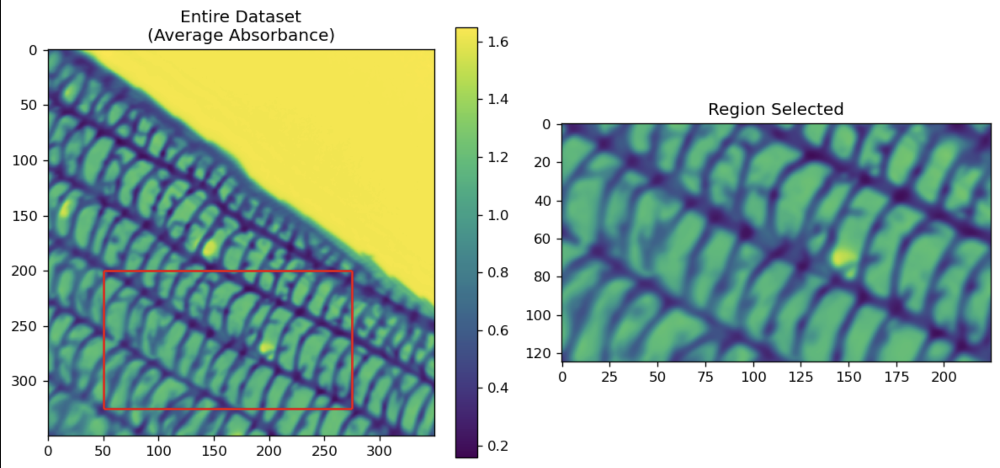

In [33]:
amp_vis.shape

(350, 350)

/var/tmp/pbs.14252.cbis-pbs/ipykernel_1336192/2455777632.py:11: RuntimeWarning: Mean of empty slice
  avg_absorbance = np.nanmean(absorption_masked, axis=0)  # (H, W)


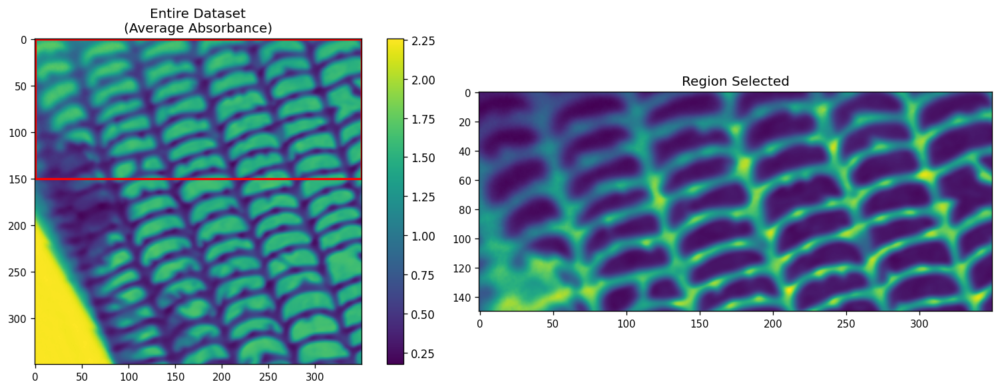

In [34]:
# YOUR TURN: Select a small region for analysis.
import matplotlib.patches as patches
import numpy as np
import matplotlib.pyplot as plt

# ===== 1. 外观图：Amplitude（不mask）=====
amp_vis = amplitude_im.mean(axis=0)   # (H, W)
amp_vis = np.nan_to_num(amp_vis, nan=0.0)

# Average absorbance over energies (ignore background)
avg_absorbance = np.nanmean(absorption_masked, axis=0)  # (H, W)

# Define ROI (x = columns, y = rows)
# This matches the red box in your figure
x1, x2 = 0, 350    # columns (left → right)
y1, y2 = 0, 150   # rows    (top → bottom)

# Crop ROI for analysis (BACKGROUND ALREADY REMOVED)
roi_absorption = absorption_masked[:, y1:y2, x1:x2]   # (E, roiH, roiW)
roi_avg_abs = avg_absorbance[y1:y2, x1:x2]            # (roiH, roiW)

# Plot: full image with red box + cropped region
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=120)

# 仅用于显示，不影响后续分析
avg_absorbance_vis = np.nan_to_num(avg_absorbance, nan=0.0)
roi_avg_abs_vis    = np.nan_to_num(roi_avg_abs, nan=0.0)


im0 = axes[0].imshow(amp_vis, cmap="viridis")
# im0 = axes[0].imshow(avg_absorbance_vis, cmap="viridis")
im1 = axes[1].imshow(roi_avg_abs_vis, cmap="viridis")

# ---- Left: full image ----
# im0 = axes[0].imshow(avg_absorbance, cmap="viridis")
axes[0].set_title("Entire Dataset\n(Average Absorbance)")
axes[0].tick_params(labelsize=9)

rect = patches.Rectangle(
    (x1, y1), x2 - x1, y2 - y1,
    linewidth=2, edgecolor="red", facecolor="none"
)
axes[0].add_patch(rect)
plt.colorbar(im0, ax=axes[0], fraction=0.046)

# ---- Right: ROI ----
# im1 = axes[1].imshow(roi_avg_wabs, cmap="viridis")
axes[1].set_title("Region Selected")
axes[1].tick_params(labelsize=9)

plt.tight_layout()
plt.show()

--------------
## TASK 3: De-noising Signals

Checking the spectra at each pixel position, we can still observe fluctuations we shouldn't expect. This suggests the data is still somewhat noisy. We now need to denoise the spectra! You should obtain a result similar to the one seen below. You may explore various de-noising methods and determine if a specific method works best.

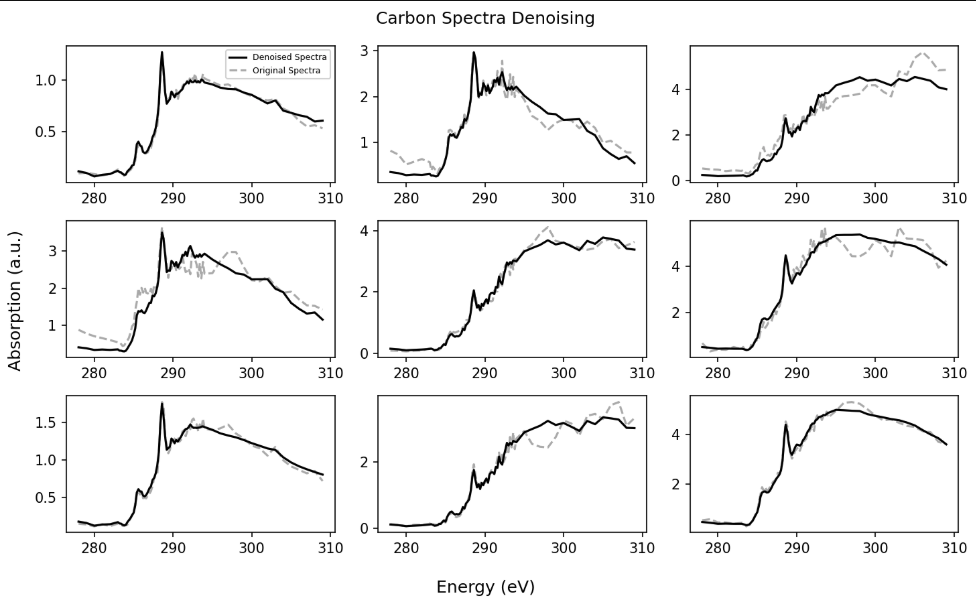

Valid ROI pixels: (52500, 77)


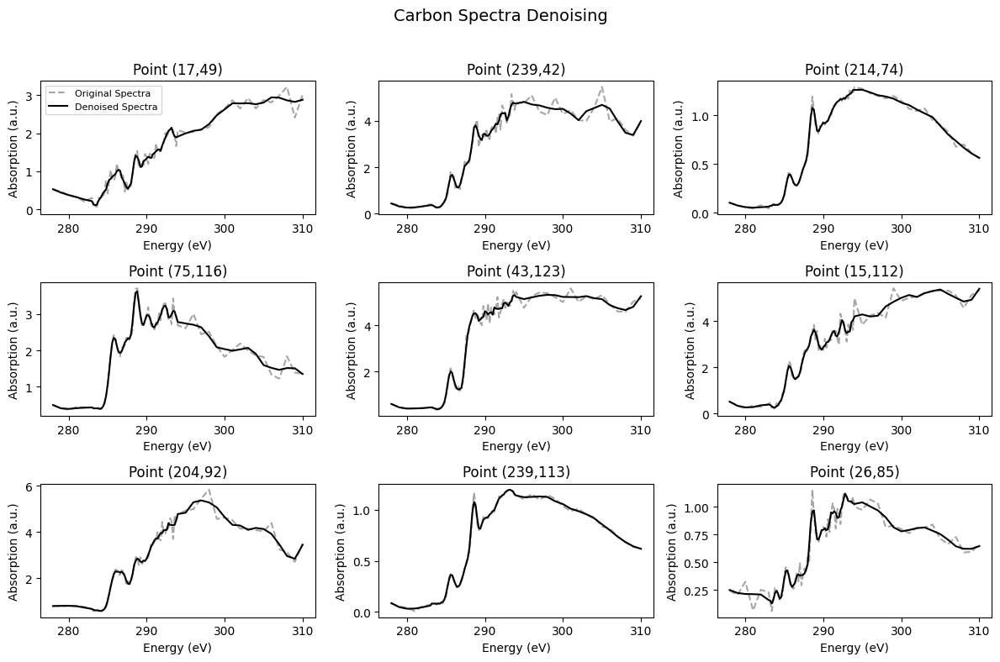

In [35]:
# TASK 3: De-noising Signals (ROI + background removed)
# Assumes you already have: energy, bg_mask, absorption_masked, and ROI coords x1,x2,y1,y2

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.signal import savgol_filter

# Prepare ROI data (use background-masked absorption)

E_full, H, W = absorption_masked.shape

roi = absorption_masked[:, y1:y2, x1:x2]   # (E, h, w)
E, h, w = roi.shape

X = roi.transpose(1, 2, 0).reshape(-1, E)  # (h*w, E)

valid = ~np.isnan(X).any(axis=1)           # keep only foreground (non-background) pixels
X_valid = X[valid]
print("Valid ROI pixels:", X_valid.shape)

# PCA denoise (on ROI foreground pixels only)
pca = PCA(n_components=10)
X_denoised_valid = pca.inverse_transform(pca.fit_transform(X_valid))

X_denoised = np.full_like(X, np.nan)
X_denoised[valid] = X_denoised_valid

roi_denoised = X_denoised.reshape(h, w, E).transpose(2, 0, 1)  # (E, h, w)

absorption_denoised = absorption_masked.copy()
absorption_denoised[:, y1:y2, x1:x2] = roi_denoised

# Randomly pick 9 foreground pixels STRICTLY inside the ROI box (global coords)


ys_all, xs_all = np.where(
    (~bg_mask) &
    (np.arange(H)[:, None] >= y1) & (np.arange(H)[:, None] < y2) &
    (np.arange(W)[None, :] >= x1) & (np.arange(W)[None, :] < x2)
)

assert len(xs_all) >= 9, "Foreground pixels inside ROI are fewer than 9."
sel_idx = np.random.choice(len(xs_all), size=9, replace=False)
xs = xs_all[sel_idx]
ys = ys_all[sel_idx]


# Plot (KEEP your axis labels/ticks style)
fig, axes = plt.subplots(3, 3, figsize=(12, 8))
axes = axes.ravel()

for i in range(9):
    x, y = xs[i], ys[i]

    spec = absorption[:, y, x]   # original = before denoising
    # spec    = absorption_masked[:, y, x]        # original (background removed)
    spec_dn = absorption_denoised[:, y, x]      # denoised

    # Savitzky-Golay smoothing on ORIGINAL
    win = 7
    if win >= len(spec):
        win = len(spec) - 1
    if win % 2 == 0:
        win -= 1
    spec_dn = savgol_filter(spec, window_length=win, polyorder=3)

    ax = axes[i]
    ax.plot(energy, spec,    '--', color='gray',  alpha=0.7, label='Original Spectra')
    ax.plot(energy, spec_dn, '-',  color='black', linewidth=1.5, label='Denoised Spectra')
    ax.set_title(f"Point ({x},{y})")
    ax.set_xlabel("Energy (eV)")
    ax.set_ylabel("Absorption (a.u.)")

    if i == 0:
        ax.legend(loc='best', fontsize=8)

fig.suptitle("Carbon Spectra Denoising", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

--------------
## TASK 4: Pre-edge Removal

We're almost done treating the data! At this point, we still notice a signal before the carbon edge (known as a pre-edge signal), and now need to remove this signal. Remove the contributions from the pre-edge in a similar method as shown below:

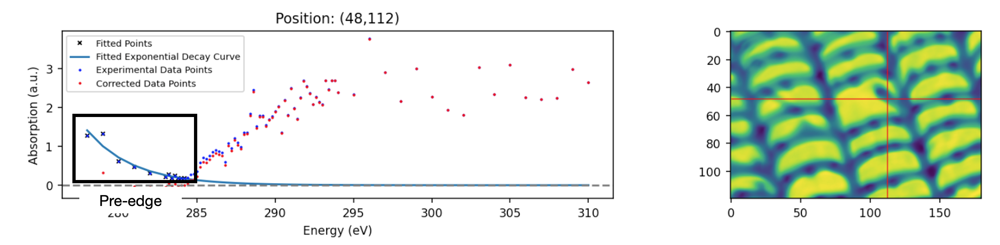

After performing pre-edge removal correctly, you should see the average of all spectra looking like this

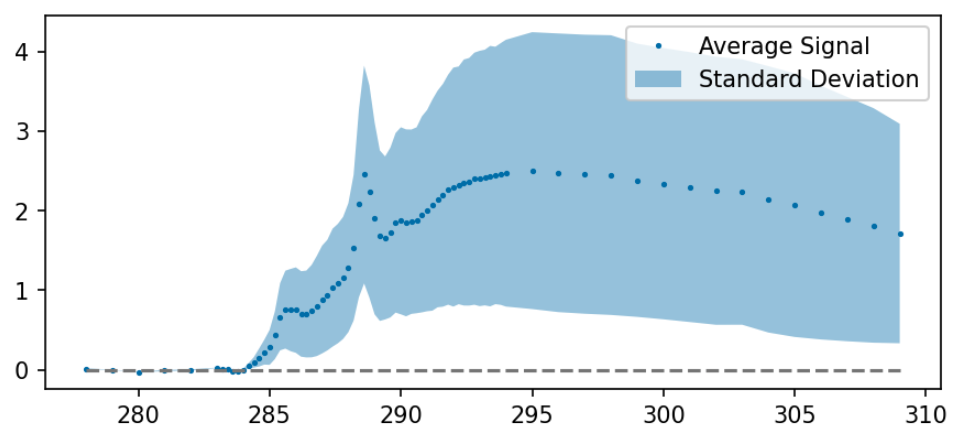

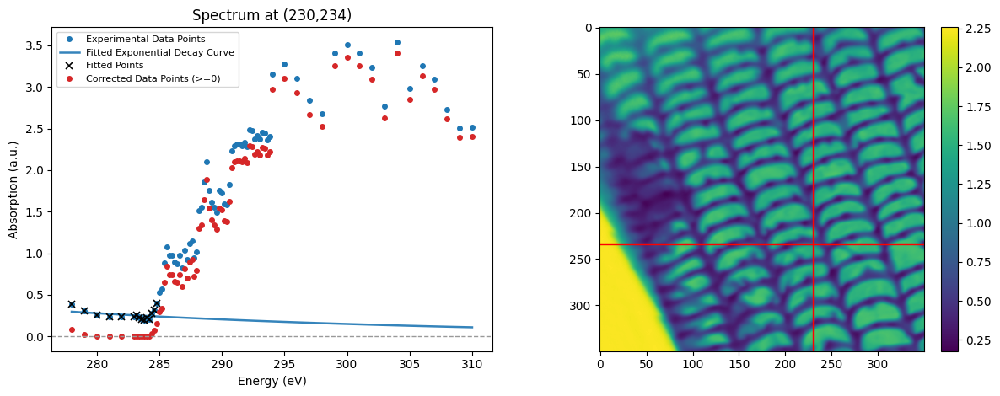

In [36]:
# YOUR TURN: Pre-edge removal (vectorized exponential fit on pre-edge)

import numpy as np
import matplotlib.pyplot as plt

# Settings
# x, y = 263, 204
x, y = 230, 234

use_corrected = True   
E = energy.astype(float)

# If you want to correct your denoised spectra, replace `absorption` with `absorption_denoised` (or your smoothed cube)
data_cube = absorption.astype(float)  # (E, H, W)

E_len, H, W = data_cube.shape

# -Define pre-edge region
mask_pre = E < 285.0
E_pre = E[mask_pre]
E0 = float(E_pre.min())
dE_pre = (E_pre - E0).astype(float)  # (n_pre,)
dE_pre_ = dE_pre[:, None, None]      # (n_pre,1,1)

Y_pre = data_cube[mask_pre, :, :]    # (n_pre,H,W)

# Fit exponential baseline: Y = A * exp(-B * (E-E0))
#    -> logY = alpha + beta * dE, where alpha=logA, beta=-B
Y_pre_clip = np.clip(Y_pre, 1e-6, None)
logY = np.log(Y_pre_clip)

Wmask = np.isfinite(logY).astype(float)
if 'bg_mask' in locals() and bg_mask is not None:
    Wmask *= (~bg_mask)[None, :, :].astype(float)

n   = np.sum(Wmask, axis=0)                       # (H,W)
Sx  = np.sum(Wmask * dE_pre_, axis=0)             # (H,W)
Sxx = np.sum(Wmask * (dE_pre_**2), axis=0)        # (H,W)
Sy  = np.sum(Wmask * logY, axis=0)                # (H,W)
Sxy = np.sum(Wmask * (dE_pre_ * logY), axis=0)    # (H,W)

Den = n * Sxx - Sx * Sx
Den = np.where(Den == 0, 1e-12, Den)

beta  = (n * Sxy - Sx * Sy) / Den                 # (H,W)
alpha = (Sy - beta * Sx) / np.maximum(n, 1.0)     # (H,W)

A_fit = np.exp(alpha)                              # (H,W)
B_fit = np.clip(-beta, 0.0, 10.0)                  # (H,W) 关键：B = -beta, and B>=0

# Build baseline cube and subtract
dE_full = (E - E0)[:, None, None]                  # (E,1,1)
preedge_baseline = A_fit[None, :, :] * np.exp(-B_fit[None, :, :] * dE_full)  # (E,H,W)

preedge_removed = data_cube - preedge_baseline
np.maximum(preedge_removed, 0.0, out=preedge_removed)  # keep >=0 like your plot style

# Optional: mask background pixels for later averaging/plots
if 'bg_mask' in locals() and bg_mask is not None:
    preedge_removed_masked = preedge_removed.copy()
    preedge_removed_masked[:, bg_mask] = np.nan
else:
    preedge_removed_masked = preedge_removed

# Single-pixel plot (like teacher’s pre-edge figure)
spec_raw  = data_cube[:, y, x]
spec_base = preedge_baseline[:, y, x]
spec_corr = preedge_removed[:, y, x]

fig, axes = plt.subplots(1, 2, figsize=(12, 4.8))

axes[0].plot(E, spec_raw, 'o', ms=4, color='tab:blue', label='Experimental Data Points')
axes[0].plot(E, spec_base, '-', lw=1.8, color='tab:blue', alpha=0.9, label='Fitted Exponential Decay Curve')
axes[0].plot(E[mask_pre], spec_raw[mask_pre], 'x', ms=6, mew=1.2, color='black', label='Fitted Points')
axes[0].plot(E, spec_corr, 'o', ms=4, color='tab:red', label='Corrected Data Points (>=0)')
axes[0].axhline(0.0, ls='--', lw=1, color='0.6')
axes[0].set_xlabel('Energy (eV)')
axes[0].set_ylabel('Absorption (a.u.)')
axes[0].set_title(f'Spectrum at ({x},{y})')
axes[0].legend(loc='best', fontsize=8)

# Right: map with background set to white
# After mask
# map_img_show = amplitude_im.mean(axis=0).copy()
# map_img_show = np.where(bg_mask, np.nan, map_img_show)  # 背景置 NaN

# cmap = plt.cm.viridis.copy()
# cmap.set_bad(color='white')  # NaN 显示为白色

# im = axes[1].imshow(map_img_show, cmap=cmap)
# axes[1].axhline(y, color='red', lw=1)
# axes[1].axvline(x, color='red', lw=1)
# fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

# Right: map WITHOUT mask (pure amplitude)
# without mask
map_img_show = amp_vis  # 直接用，不动 bg_mask

im = axes[1].imshow(map_img_show, cmap="viridis")
axes[1].axhline(y, color='red', lw=1)
axes[1].axvline(x, color='red', lw=1)
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

# Average spectra before/after pre-edge removal
# avg_before = np.nanmean(data_cube, axis=(1,2)) if ('bg_mask' not in locals() or bg_mask is None) else np.nanmean(np.where(bg_mask[None,:,:], np.nan, data_cube), axis=(1,2))
# avg_after  = np.nanmean(preedge_removed_masked, axis=(1,2))

# axes[1].plot(E, avg_before, 'o-', ms=3, color='0.5', label='Average (before pre-edge removal)')
# axes[1].plot(E, avg_after,  'o-', ms=3, color='tab:red', label='Average (after pre-edge removal)')
# axes[1].axvline(285.0, ls='--', lw=1, color='0.6')
# axes[1].set_xlabel('Energy (eV)')
# axes[1].set_ylabel('Absorption (a.u.)')
# axes[1].set_title('Average of all spectra')
# axes[1].legend(loc='best', fontsize=8)

plt.tight_layout()
plt.show()

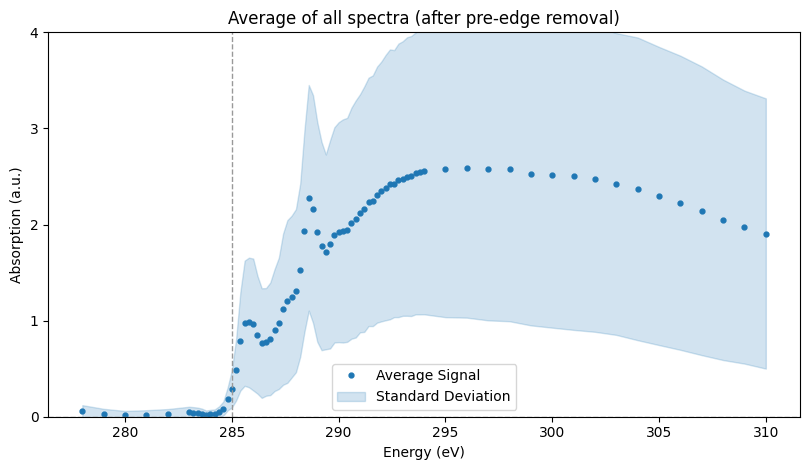

In [37]:
import numpy as np
import matplotlib.pyplot as plt

spec_corr_cube = preedge_removed
spec_corr_cube_masked = spec_corr_cube.copy()
spec_corr_cube_masked[:, bg_mask] = np.nan

avg_plot = np.nanmean(spec_corr_cube_masked, axis=(1, 2))
std_plot = np.nanstd(spec_corr_cube_masked, axis=(1, 2), ddof=1)

plt.figure(figsize=(8.2, 4.8))
plt.plot(E, avg_plot, 'o', ms=3.5, color='tab:blue', label='Average Signal')
plt.fill_between(E, avg_plot - std_plot, avg_plot + std_plot,
                 color='tab:blue', alpha=0.20, label='Standard Deviation')

plt.ylim(0, 4)
plt.yticks(np.arange(0, 5, 1))

plt.axhline(0.0, ls='--', lw=1, color='0.6')
plt.axvline(285.0, ls='--', lw=1, color='0.6')   # 碳边
plt.title('Average of all spectra (after pre-edge removal)')
plt.xlabel('Energy (eV)')
plt.ylabel('Absorption (a.u.)')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [38]:
spec_corr_cube.shape

(77, 350, 350)

--------------
## TASK 5: Scale Segmentation

A butterfly scale is made up of several segments as shown below.

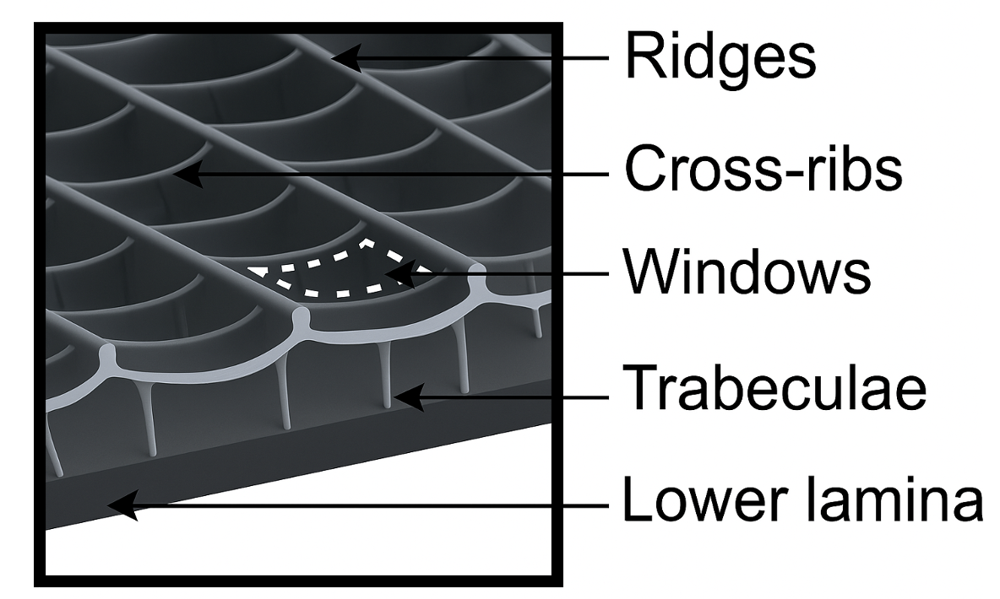

Your task now is to find a way to label the segments of the scale. You should expect a result that looks something like what is shown below (but of course, if you can do better, by all means do so!):


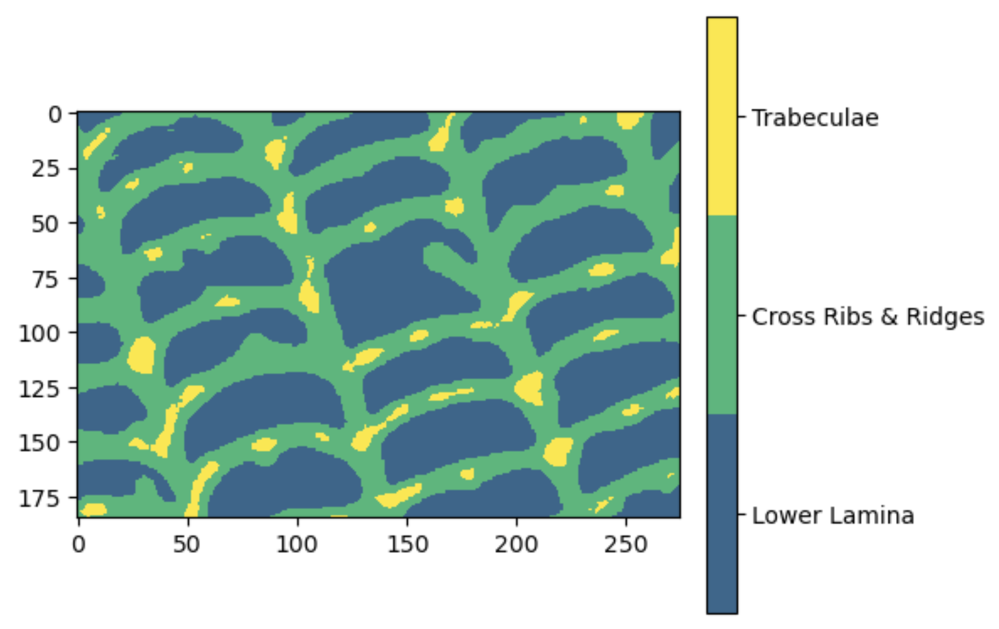

In [46]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

from sklearn.manifold import TSNE
import umap.umap_ as umap


# 0) Choose the cube to cluster
# cube should be shape (E, H, W), background pixels are NaN (recommended)
cube = preedge_removed_masked    

assert cube.ndim == 3, "cube must be (E,H,W)"
E, H, W = cube.shape


# 1) ROI selection 
use_roi = True

# Use ROI coords from earlier (x=col, y=row)
# x1, x2 = 60, 280
# y1, y2 = 200, 330
if use_roi:
    cube_roi = cube[:, y1:y2, x1:x2]             # (E, h, w)
    bg_roi = bg_mask[y1:y2, x1:x2]               # (h, w)
    E, h, w = cube_roi.shape
else:
    cube_roi = cube
    bg_roi = bg_mask
    h, w = H, W


# 2) Build per-pixel feature vectors
X = cube_roi.transpose(1, 2, 0).reshape(-1, E)   # (h*w, E)

# valid pixels: not background + no NaN
valid = (~bg_roi.reshape(-1)) & (~np.isnan(X).any(axis=1))
Xv = X[valid]                                    # (N_valid, E)

print("cube_roi:", cube_roi.shape)
print("valid pixels:", Xv.shape[0], "/", h*w)

##################

# 3) Per-spectrum normalization (reduce thickness effect)
# den = np.sum(np.abs(Xv), axis=1, keepdims=True) + 1e-8
# Xv_norm = Xv / den

# 4) Standardize features then UMAP embedding
# scaler = StandardScaler()
# Xv_s = scaler.fit_transform(Xv_norm)


# 3) 不做 per-spectrum 归一化：保留强度 
Xraw = Xv.copy()

# 4) 加一个“厚度/强度”特征
area = Xraw.sum(axis=1, keepdims=True)          # (N,1) 面积/厚度 proxy
Xfeat = np.hstack([Xraw, 0.5 * area])           # 0.5 是权重，你可以调 0.2~2.0

Xv_s = StandardScaler().fit_transform(Xfeat)

##################

n_neighbors = 30
min_dist = 0.1
umap_model = umap.UMAP(
    n_components=2,
    n_neighbors=n_neighbors,
    min_dist=min_dist,
    metric="euclidean",
    random_state=1538688
)
emb = umap_model.fit_transform(X_valid)

/home/svu/e1547010/myenv/lib64/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cube_roi: (77, 150, 350)
valid pixels: 52500 / 52500


/home/svu/e1547010/myenv/lib64/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [47]:
 preedge_removed_masked.shape

(77, 350, 350)

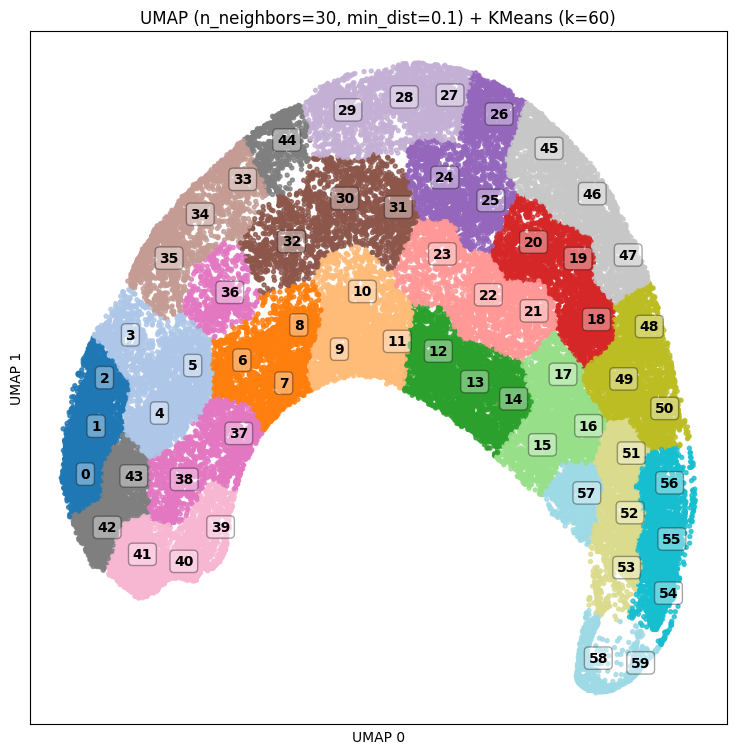

In [48]:
# 5) KMeans clustering on TSNE embedding
k = 60 #60 not good      
kmeans = KMeans(n_clusters=k, random_state=1538688, n_init="auto")
labels_v = kmeans.fit_predict(emb)     # (N_valid,)
centers = kmeans.cluster_centers_      # (k, 2)

# ===== Reorder cluster IDs so nearby clusters get nearby numbers =====
# Start from the leftmost cluster, then greedily visit the nearest next center
start = np.argmin(centers[:, 0])   # leftmost cluster
unused = set(range(k))
unused.remove(start)

order = [start]
while unused:
    last = order[-1]
    rest = np.array(list(unused))
    dists = np.linalg.norm(centers[rest] - centers[last], axis=1)
    nxt = rest[np.argmin(dists)]
    order.append(nxt)
    unused.remove(nxt)

# old label -> new label
old_to_new = np.empty(k, dtype=int)
for new_id, old_id in enumerate(order):
    old_to_new[old_id] = new_id

# relabel
labels_v = old_to_new[labels_v]
centers = centers[order]

# Fill back into 2D label image
labels_flat = np.full(h*w, fill_value=-1, dtype=np.int32)
labels_flat[valid] = labels_v
labels_2d = labels_flat.reshape(h, w)


# 6) Visualize TSNE scatter with cluster ids
plt.figure(figsize=(9, 9))
plt.scatter(emb[:, 0], emb[:, 1], c=labels_v, cmap="tab20", s=8, alpha=0.8)
for i, (cx, cy) in enumerate(centers):
    plt.text(cx, cy, str(i), fontsize=10, color="black", fontweight="bold",
             bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.3", alpha=0.35))
plt.xticks([]); plt.yticks([])
plt.xlabel("UMAP 0"); plt.ylabel("UMAP 1")
plt.title(f"UMAP (n_neighbors={n_neighbors}, min_dist={min_dist}) + KMeans (k={k})")
plt.show()


# 7) Overlay clusters on average image (position/morphology)
avg_img = np.nanmean(cube_roi, axis=0)  # (h,w)
avg_img_vis = np.nan_to_num(avg_img, nan=0.0)

# plt.figure(figsize=(6,6))
# plt.imshow(avg_img_vis, cmap="bone")
# plt.imshow(np.ma.masked_where(labels_2d < 0, labels_2d), cmap="tab20", alpha=0.65)
# plt.title("Cluster labels overlaid on average image")
# plt.axis("off")
# plt.show()


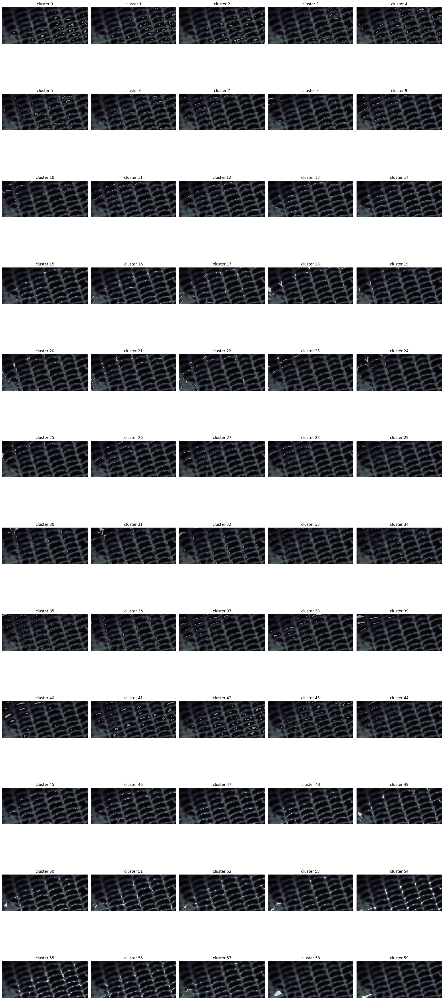

In [49]:
# Show each cluster mask overlaid (like assignment)
nrows = int(np.ceil(k / 5))
ncols = 5
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = np.array(axes).ravel()
for c in range(nrows*ncols):
    ax = axes[c]
    ax.imshow(avg_img_vis, cmap="bone")
    if c < k:
        ax.imshow((labels_2d == c), cmap="gray", alpha=0.55)
        ax.set_title(f"cluster {c}")
    else:
        ax.set_title("")
    ax.axis("off")
plt.tight_layout()
plt.show()


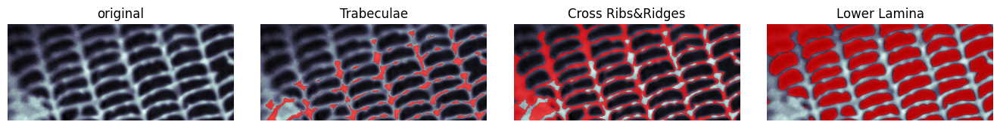

In [50]:
from matplotlib.colors import ListedColormap
import numpy as np
import matplotlib.pyplot as plt

# Transparent for 0, fully opaque red for 1
MASK_CMAP = ListedColormap([[0, 0, 0, 0],
                            [1, 0, 0, 1]])  # RGBA

def mask_rgba(mask, color=(1.0, 0.0, 0.0)):
    mask = (mask > 0)
    h_, w_ = mask.shape
    rgba = np.zeros((h_, w_, 4), dtype=float)
    rgba[mask, :3] = color
    rgba[mask, 3] = 1.0
    return rgba

# 30 50
merge = {
#    "original":     [],                                              
    "Trabeculae":       [50,52,53,54,55,56],#
    "Cross Ribs&Ridges":[14,15,16,17,18,19,20,21,22,23,24,25,46,47,48,49,51,57,58,59], # 
    "Lower Lamina":     [0,1,2,3,4,5,6,7,8,9,10,11,12,13,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45],
    
}


class_names = list(merge.keys())
label_map = np.zeros((h, w), dtype=np.uint8)

for cls_idx, name in enumerate(class_names, start=1):
    clusters = merge[name]
    m = np.isin(labels_2d, clusters)
    label_map[m] = cls_idx



sublist_types  = ["original"] + list(merge.keys())
sublist_labels = [[]] + list(merge.values())


fig, axes = plt.subplots(1, len(sublist_types), figsize=(4.2*len(sublist_types), 4.2),
                         sharex=True, sharey=True)

for l, t, ax in zip(sublist_labels, sublist_types, axes.ravel()):
    ax.imshow(avg_img_vis, cmap="bone")

    if l:  # not original
        mask = np.isin(labels_2d, l)  # (h,w) bool
        ax.imshow(mask_rgba(mask, color=(1,0,0)), alpha=0.7)

    ax.set_title(t, fontsize=12)
    ax.axis("off")

plt.subplots_adjust(wspace=0.12)
plt.show()

In [51]:
import numpy as np
semantic_2d = np.full_like(labels_2d, fill_value=-1, dtype=np.int32)
# Lower lamina
semantic_2d[np.isin(labels_2d, merge["Lower Lamina"])] = 0
# Cross ribs & ridges
semantic_2d[np.isin(labels_2d, merge["Cross Ribs&Ridges"])] = 1
# Trabeculae
semantic_2d[np.isin(labels_2d, merge["Trabeculae"])] = 2

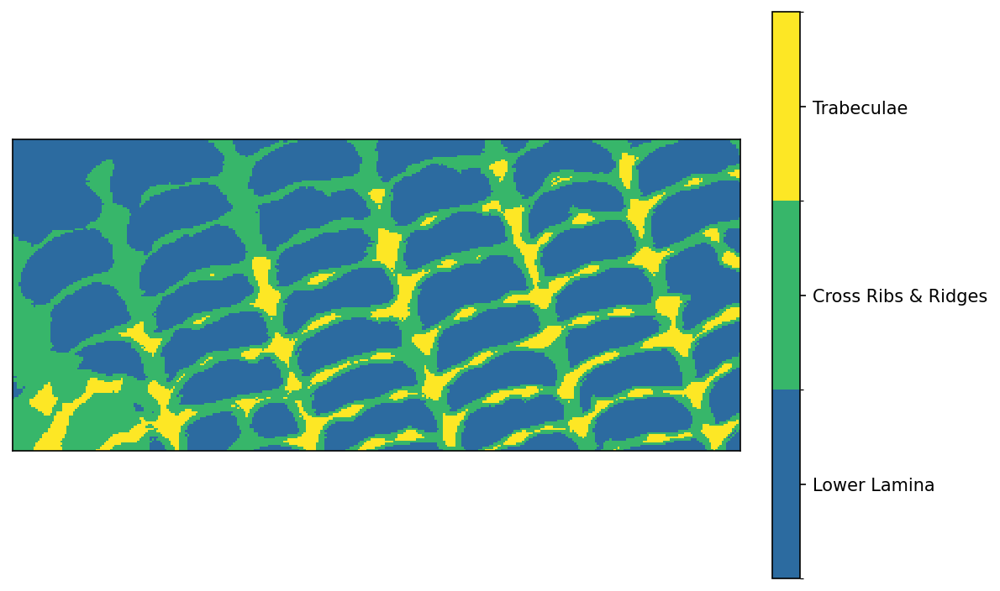

In [52]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

names = ["Lower Lamina", "Cross Ribs & Ridges", "Trabeculae"]


cmap = ListedColormap([
    "#2C6BA0",  # blue
    "#37B66A",  # green
    "#FDE725",  # yellow
])
cmap.set_bad("white")

show = semantic_2d.astype(float)
show[show < 0] = np.nan   # background → white

norm = BoundaryNorm(np.arange(-0.5, 3.5, 1), cmap.N)

plt.figure(figsize=(8, 4.8), dpi=150)
im = plt.imshow(show, cmap=cmap, norm=norm, interpolation="nearest")
plt.xticks([]); plt.yticks([])

cbar = plt.colorbar(im, fraction=0.046, pad=0.04, ticks=[0, 1, 2])
cbar.ax.set_yticklabels(names)

plt.tight_layout()
plt.show()

--------------
## TASK 6: Exploration!

Great job on treating the dataset! Now its your turn! Take over and play around with the data and see what you might find! 

You could consider...
- Supervised approaches, such as training a neural network to study the relationship between the absorbance and phases
- Unsupervised approaches, to study relationships in the spectra within the scale.

Good luck!

Using device: cuda
Using 75 energy channels from 280.0 to 310.0 eV
Valid pixels: 52500 / 52500
Reference used for residual learning: Lower Lamina
SpectralMLP(
  (stem): Sequential(
    (0): Linear(in_features=75, out_features=512, bias=True)
    (1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    (2): GELU(approximate='none')
    (3): Dropout(p=0.1, inplace=False)
  )
  (blocks): ModuleList(
    (0-5): 6 x ResidualBlock(
      (block): Sequential(
        (0): Linear(in_features=512, out_features=512, bias=True)
        (1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (2): GELU(approximate='none')
        (3): Dropout(p=0.1, inplace=False)
        (4): Linear(in_features=512, out_features=512, bias=True)
        (5): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
      (act): GELU(approximate='none')
    )
  )
  (head): Sequential(
    (0): Linear(in_features=512, out_features=192, bias=True)
    (1): LayerNorm((192,), eps=1e-05, elementwise_

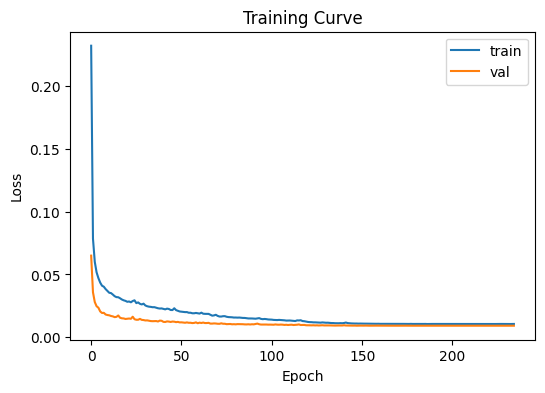

[Validation] Angular MAE  = 0.070039 rad
[Validation] Angular RMSE = 0.147742 rad
[Validation] Mean cos(err)= 0.990789
[Validation] R2 (supplementary) = 0.611264
[Lower Lamina] Angular MAE  = 0.048668 rad
[Lower Lamina] Angular RMSE = 0.085615 rad
[Lower Lamina] Mean cos(err)= 0.996680
[Lower Lamina] R2 (supplementary) = 0.804646
[Cross Ribs & Ridges] Angular MAE  = 0.088272 rad
[Cross Ribs & Ridges] Angular RMSE = 0.168775 rad
[Cross Ribs & Ridges] Mean cos(err)= 0.987686
[Cross Ribs & Ridges] R2 (supplementary) = 0.650064
[Trabeculae] Angular MAE  = 0.138050 rad
[Trabeculae] Angular RMSE = 0.291331 rad
[Trabeculae] Mean cos(err)= 0.966358
[Trabeculae] R2 (supplementary) = 0.401750


,set,angular_mae_rad,angular_rmse_rad,mean_cos_error,r2_supplementary,n_pixels,class_id,class_name
0,Validation,0.070039,0.147742,0.990789,0.611264,NaN,NaN,NaN
1,Lower Lamina,0.048668,0.085615,0.996680,0.804646,6199.0,0.0,Lower Lamina
2,Cross Ribs & Ridges,0.088272,0.168775,0.987686,0.650064,3215.0,1.0,Cross Ribs & Ridges
3,Trabeculae,0.138050,0.291331,0.966358,0.401750,1086.0,2.0,Trabeculae


In [64]:
# =========================================================
# MLP for predicting phase from absorbance
# Recommended version: Reference-Residual Spectral MLP
# - Input: absorbance spectrum (and optional pre-edge-removed spectrum)
# - Target: sin/cos of phase residual relative to reference phase
# - Optional class balancing if semantic_2d exists
# =========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# -----------------------------
# 0) Basic config
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Energy window: recommended to focus on the physically meaningful region first
use_energy_window = True
E_min, E_max = 280.0, 320.0

# If True and preedge_removed_masked exists, use it as extra input feature
use_preedge_feature = ('preedge_removed_masked' in globals())

# Training config
random_state = 42
test_size = 0.20
batch_size = 2048
max_epochs = 300
lr = 5e-4
weight_decay = 1e-4
patience = 40

# -----------------------------
# 1) Select energy range
# -----------------------------
energy = np.asarray(energy).astype(float)

if use_energy_window:
    keep = (energy >= E_min) & (energy <= E_max)
else:
    keep = np.ones_like(energy, dtype=bool)

energy_kept = energy[keep]
d = keep.sum()

print(f"Using {d} energy channels from {energy_kept.min():.1f} to {energy_kept.max():.1f} eV")

# -----------------------------
# 2) Get input/output cubes
# -----------------------------
# Input 1: raw absorbance spectrum
X_abs_cube = absorption_masked[keep, y1:y2, x1:x2].astype(np.float32)

if use_preedge_feature:
    X_pre_cube = preedge_removed_masked[keep, y1:y2, x1:x2].astype(np.float32)

Y_phase_cube = phase_masked[keep, y1:y2, x1:x2].astype(np.float32)

d, H, W = X_abs_cube.shape
N_total = H * W

# Flatten to per-pixel spectra
X_abs_full = X_abs_cube.transpose(1, 2, 0).reshape(N_total, d)   # (N, d)
Y_phase_full = Y_phase_cube.transpose(1, 2, 0).reshape(N_total, d)

if use_preedge_feature:
    X_pre_full = X_pre_cube.transpose(1, 2, 0).reshape(N_total, d)

# -----------------------------
# 3) Optional semantic labels
# -----------------------------
has_semantic = ('semantic_2d' in globals()) and (semantic_2d is not None)

if has_semantic:
    cls_full = semantic_2d.reshape(-1).astype(int)   # 0,1,2 or -1 for invalid/background
else:
    cls_full = np.full(N_total, -1, dtype=int)

# -----------------------------
# 4) Build valid mask
# -----------------------------
valid = np.all(np.isfinite(X_abs_full), axis=1) & np.all(np.isfinite(Y_phase_full), axis=1)

if use_preedge_feature:
    valid &= np.all(np.isfinite(X_pre_full), axis=1)

# Remove background / invalid semantic label only if semantic exists
if has_semantic:
    valid &= (cls_full >= 0)

print("Valid pixels:", valid.sum(), "/", N_total)

X_abs_valid = X_abs_full[valid]
Y_phase_valid = Y_phase_full[valid]
cls_valid = cls_full[valid] if has_semantic else None

if use_preedge_feature:
    X_pre_valid = X_pre_full[valid]

# -----------------------------
# 5) Define reference spectra
# -----------------------------
def circular_mean(theta, axis=0):
    return np.angle(np.mean(np.exp(1j * theta), axis=axis))

# Prefer Lower Lamina (class 0) as reference if available
if has_semantic and np.sum(cls_valid == 0) > 20:
    ref_mask = (cls_valid == 0)
    ref_name = "Lower Lamina"
else:
    ref_mask = np.ones(len(X_abs_valid), dtype=bool)
    ref_name = "global mean"

abs_ref = X_abs_valid[ref_mask].mean(axis=0)    # (d,)
phase_ref = circular_mean(Y_phase_valid[ref_mask], axis=0)  # (d,)

print("Reference used for residual learning:", ref_name)

if use_preedge_feature:
    pre_ref = X_pre_valid[ref_mask].mean(axis=0)

# -----------------------------
# 6) Build features
# -----------------------------
# Thickness / intensity proxy
X_feat = X_abs_valid.astype(np.float32)

# -----------------------------
# 7) Build target as sin/cos of phase residual
# -----------------------------
# residual phase relative to reference
Y_res = np.angle(np.exp(1j * (Y_phase_valid - phase_ref[None, :])))  # (N,d)

Y_target = np.hstack([
    np.sin(Y_res),
    np.cos(Y_res)
]).astype(np.float32)  # (N, 2d)

# -----------------------------
# 8) Train/val split
# -----------------------------
indices = np.arange(len(X_feat))

if has_semantic and len(np.unique(cls_valid)) > 1:
    train_idx, val_idx = train_test_split(
        indices,
        test_size=test_size,
        random_state=random_state,
        stratify=cls_valid
    )
else:
    train_idx, val_idx = train_test_split(
        indices,
        test_size=test_size,
        random_state=random_state
    )

X_train, X_val = X_feat[train_idx], X_feat[val_idx]
Y_train, Y_val = Y_target[train_idx], Y_target[val_idx]

if has_semantic:
    cls_train, cls_val = cls_valid[train_idx], cls_valid[val_idx]
else:
    cls_train, cls_val = None, None

Y_phase_train = Y_phase_valid[train_idx]
Y_phase_val = Y_phase_valid[val_idx]

# -----------------------------
# 9) Standardize inputs
# -----------------------------
x_scaler = StandardScaler()
X_train_s = x_scaler.fit_transform(X_train).astype(np.float32)
X_val_s = x_scaler.transform(X_val).astype(np.float32)

# -----------------------------
# 10) Optional class-balanced sample weights
# -----------------------------
if has_semantic:
    unique_cls, counts = np.unique(cls_train, return_counts=True)
    cls_count_dict = {c: n for c, n in zip(unique_cls, counts)}
    sample_weights_train = np.array([1.0 / cls_count_dict[c] for c in cls_train], dtype=np.float32)
    sample_weights_train *= len(sample_weights_train) / sample_weights_train.sum()
else:
    sample_weights_train = np.ones(len(X_train_s), dtype=np.float32)

# Validation weights: uniform
sample_weights_val = np.ones(len(X_val_s), dtype=np.float32)

# -----------------------------
# 11) PyTorch dataset
# -----------------------------
train_ds = TensorDataset(
    torch.from_numpy(X_train_s),
    torch.from_numpy(Y_train),
    torch.from_numpy(sample_weights_train)
)
val_ds = TensorDataset(
    torch.from_numpy(X_val_s),
    torch.from_numpy(Y_val),
    torch.from_numpy(sample_weights_val)
)

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, drop_last=False)

# -----------------------------
# 12) Model
# -----------------------------
class ResidualBlock(nn.Module):
    def __init__(self, dim, dropout=0.10):
        super().__init__()
        self.block = nn.Sequential(
            nn.Linear(dim, dim),
            nn.LayerNorm(dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(dim, dim),
            nn.LayerNorm(dim),
        )
        self.act = nn.GELU()

    def forward(self, x):
        return self.act(x + self.block(x))


class SpectralMLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden_dim=384, num_blocks=4, dropout=0.10):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Linear(in_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
        )

        self.blocks = nn.ModuleList([
            ResidualBlock(hidden_dim, dropout=dropout)
            for _ in range(num_blocks)
        ])

        self.head = nn.Sequential(
            nn.Linear(hidden_dim, 192),
            nn.LayerNorm(192),
            nn.GELU(),
            nn.Dropout(0.05),
            nn.Linear(192, out_dim)
        )

    def forward(self, x):
        x = self.stem(x)
        for block in self.blocks:
            x = block(x)
        x = self.head(x)
        return x

model = SpectralMLP(
    in_dim=X_train_s.shape[1],
    out_dim=2 * d,
    hidden_dim=512,
    num_blocks=6,
    dropout=0.10
).to(device)
print(model)

# -----------------------------
# 13) Loss / optimizer
# -----------------------------
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=5
)

def normalize_sin_cos(out, d):
    sin_pred = out[:, :d]
    cos_pred = out[:, d:]
    norm = torch.sqrt(sin_pred**2 + cos_pred**2 + 1e-8)
    sin_pred = sin_pred / norm
    cos_pred = cos_pred / norm
    return sin_pred, cos_pred

def weighted_sc_loss(out, target, sample_w, d):
    sin_pred, cos_pred = normalize_sin_cos(out, d)
    sin_true = target[:, :d]
    cos_true = target[:, d:]

    loss_per_sample = (
        ((sin_pred - sin_true)**2).mean(dim=1) +
        ((cos_pred - cos_true)**2).mean(dim=1)
    ) / 2.0

    loss = (loss_per_sample * sample_w).sum() / sample_w.sum()
    return loss

# -----------------------------
# 14) Training loop with early stopping
# -----------------------------
best_val = np.inf
best_state = None
wait = 0

train_losses = []
val_losses = []

for epoch in range(1, max_epochs + 1):
    # train
    model.train()
    train_loss_sum = 0.0
    train_n = 0

    for xb, yb, wb in train_loader:
        xb = xb.to(device)
        yb = yb.to(device)
        wb = wb.to(device)

        optimizer.zero_grad()
        out = model(xb)
        loss = weighted_sc_loss(out, yb, wb, d)
        loss.backward()
        optimizer.step()

        train_loss_sum += loss.item() * len(xb)
        train_n += len(xb)

    train_loss = train_loss_sum / train_n

    # val
    model.eval()
    val_loss_sum = 0.0
    val_n = 0

    with torch.no_grad():
        for xb, yb, wb in val_loader:
            xb = xb.to(device)
            yb = yb.to(device)
            wb = wb.to(device)

            out = model(xb)
            loss = weighted_sc_loss(out, yb, wb, d)

            val_loss_sum += loss.item() * len(xb)
            val_n += len(xb)

    val_loss = val_loss_sum / val_n

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    scheduler.step(val_loss)

    if epoch % 10 == 0 or epoch == 1:
        print(f"Epoch {epoch:3d} | train_loss={train_loss:.6f} | val_loss={val_loss:.6f}")

    if val_loss < best_val:
        best_val = val_loss
        best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        wait = 0
    else:
        wait += 1
        if wait >= patience:
            print(f"Early stopping at epoch {epoch}")
            break

# restore best
model.load_state_dict(best_state)

# -----------------------------
# 15) Plot learning curve
# -----------------------------
plt.figure(figsize=(6,4))
plt.plot(train_losses, label="train")
plt.plot(val_losses, label="val")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Curve")
plt.legend()
plt.show()

# -----------------------------
# 16) Inference helpers
# -----------------------------
def predict_phase_from_features(model, X_in_scaled, phase_ref, d, batch_size=4096):
    model.eval()
    preds = []

    with torch.no_grad():
        for i in range(0, len(X_in_scaled), batch_size):
            xb = torch.from_numpy(X_in_scaled[i:i+batch_size]).to(device)
            out = model(xb)
            sin_pred, cos_pred = normalize_sin_cos(out, d)

            sin_pred = sin_pred.cpu().numpy()
            cos_pred = cos_pred.cpu().numpy()

            pred_res = np.arctan2(sin_pred, cos_pred)  # (B,d)
            pred_phase = np.angle(np.exp(1j * (pred_res + phase_ref[None, :])))
            preds.append(pred_phase)

    return np.vstack(preds)

def angular_error(y_pred, y_true):
    return np.angle(np.exp(1j * (y_pred - y_true)))

def evaluate_phase(y_true, y_pred, name="set"):
    err = angular_error(y_pred, y_true)
    mae = np.mean(np.abs(err))
    rmse = np.sqrt(np.mean(err**2))
    cos_sim = np.mean(np.cos(err))

    # Supplementary only; phase is periodic, so this R2 is not the main metric
    r2 = r2_score(y_true.reshape(-1), y_pred.reshape(-1))

    print(f"[{name}] Angular MAE  = {mae:.6f} rad")
    print(f"[{name}] Angular RMSE = {rmse:.6f} rad")
    print(f"[{name}] Mean cos(err)= {cos_sim:.6f}")
    print(f"[{name}] R2 (supplementary) = {r2:.6f}")

    return {
        "set": name,
        "angular_mae_rad": mae,
        "angular_rmse_rad": rmse,
        "mean_cos_error": cos_sim,
        "r2_supplementary": r2,
    }

# -----------------------------
# 17) Validation prediction
# -----------------------------
Y_val_pred = predict_phase_from_features(model, X_val_s, phase_ref, d, batch_size=4096)

overall_metrics = evaluate_phase(Y_phase_val, Y_val_pred, name="Validation")

# -----------------------------
# 18) Per-class validation metrics
# -----------------------------
rows = [overall_metrics]

if has_semantic:
    class_names = {
        0: "Lower Lamina",
        1: "Cross Ribs & Ridges",
        2: "Trabeculae"
    }

    for c in np.unique(cls_val):
        m = (cls_val == c)
        metrics_c = evaluate_phase(Y_phase_val[m], Y_val_pred[m], name=class_names.get(c, f"class_{c}"))
        metrics_c["n_pixels"] = int(m.sum())
        metrics_c["class_id"] = int(c)
        metrics_c["class_name"] = class_names.get(c, f"class_{c}")
        rows.append(metrics_c)

metrics_df = pd.DataFrame(rows)
display(metrics_df)


/var/tmp/pbs.14252.cbis-pbs/ipykernel_1336192/376445924.py:14: RuntimeWarning: Mean of empty slice
  avg_absorbance = np.nanmean(absorption_masked, axis=0)


Training Region     : x=[0,350), y=[0,150)
Validation pixels: 63560
Background pixels: 6440


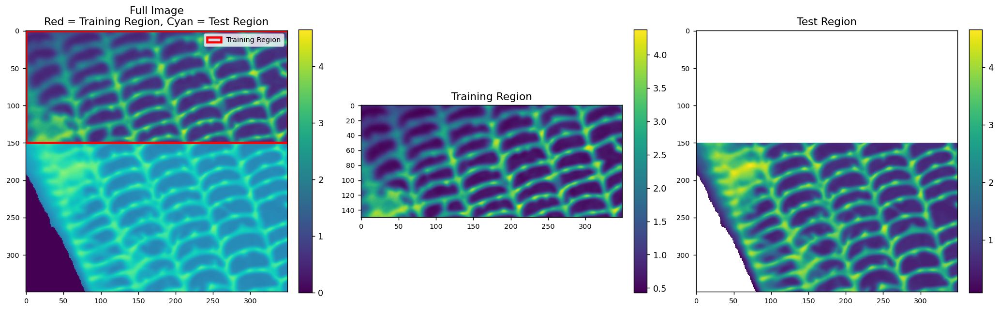

In [65]:
# =========================================================
# Cell 1: Choose a NON-overlapping validation region
# Red box  = training ROI
# Cyan box = validation region
# =========================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# -----------------------------
# 1) Background image
# -----------------------------
avg_absorbance = np.nanmean(absorption_masked, axis=0)
bg_img = np.nan_to_num(avg_absorbance, nan=0.0)
H_full, W_full = bg_img.shape
# -----------------------------
# 2) Build validation mask:
#    everything except background and training ROI
# -----------------------------
assert 'bg_mask' in globals() and bg_mask is not None, "bg_mask not found"
# foreground only
validation_mask_full = (~bg_mask).copy()
# remove training ROI
validation_mask_full[y1:y2, x1:x2] = False
print("Training Region     :", f"x=[{x1},{x2}), y=[{y1},{y2})")
print("Validation pixels:", int(validation_mask_full.sum()))
print("Background pixels:", int(bg_mask.sum()))
# save for next cell
val_mask = validation_mask_full.copy()
# -----------------------------
# 3) Visualization
# -----------------------------
fig, axes = plt.subplots(1, 3, figsize=(16, 5), dpi=130)
# full image
im0 = axes[0].imshow(bg_img, cmap="viridis")
axes[0].set_title("Full Image\nRed = Training Region, Cyan = Test Region")
axes[0].tick_params(labelsize=8)
rect_roi = patches.Rectangle(
    (x1, y1), x2 - x1, y2 - y1,
    linewidth=2.5, edgecolor="red", facecolor="none", label="Training Region"
)
axes[0].add_patch(rect_roi)
# overlay validation mask
axes[0].imshow(np.ma.masked_where(~val_mask, val_mask), cmap="cool", alpha=0.45)
axes[0].legend(loc="upper right", fontsize=8)
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)
# training ROI crop
roi_crop = bg_img[y1:y2, x1:x2]
im1 = axes[1].imshow(roi_crop, cmap="viridis")
axes[1].set_title("Training Region")
axes[1].tick_params(labelsize=8)
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
# validation-mask-only view
val_view = np.where(val_mask, bg_img, np.nan)
im2 = axes[2].imshow(val_view, cmap="viridis")
axes[2].set_title("Test Region")
axes[2].tick_params(labelsize=8)
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)
plt.tight_layout()
plt.show()


Validation image size : (350, 350)
Validation candidate pixels : 63560
Valid pixels used : 63560 / 63560
[New Validation Region] Angular MAE  = 0.121288 rad
[New Validation Region] Angular RMSE = 0.248963 rad
[New Validation Region] Mean cos(err)= 0.974368


/var/tmp/pbs.14252.cbis-pbs/ipykernel_1336192/1840346060.py:186: RuntimeWarning: Mean of empty slice
  region_avg_abs = np.nanmean(X_abs_cube, axis=0)


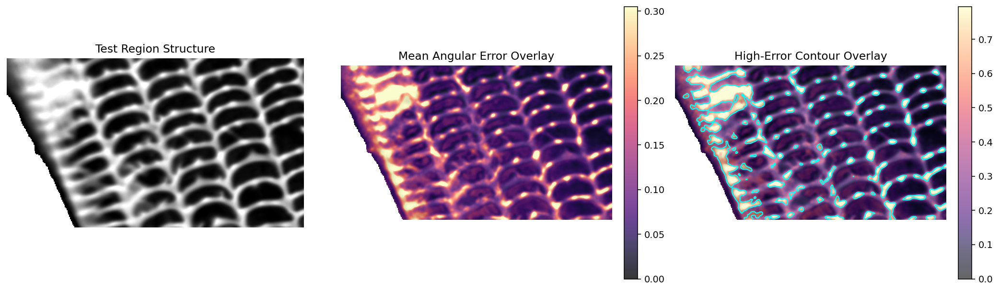

Saved results to: external_validation_results


In [66]:
# =========================================================
# Cell 2 (better visualization): External validation region
# More intuitive diagnostic plots
# =========================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

# -----------------------------
# 0) Basic checks
# -----------------------------
required_vars = [
    "model", "x_scaler", "abs_ref", "phase_ref",
    "absorption_masked", "phase_masked",
    "keep", "d", "energy_kept",
    "val_x1", "val_x2", "val_y1", "val_y2",
    "use_preedge_feature"
]
for v in required_vars:
    assert v in globals(), f"Missing required variable: {v}"

if "device" not in globals():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if use_preedge_feature:
    assert "preedge_removed_masked" in globals(), "preedge_removed_masked not found"
    assert "pre_ref" in globals(), "pre_ref not found"

# -----------------------------
# 1) Visualization controls
# -----------------------------
channel_acc_threshold = 0.08   # per-energy-channel correctness threshold
bad_pixel_acc_threshold = 0.50 # pixel is "bad" if accuracy rate < 0.50
smooth_sigma = 1.2             # for display only

# -----------------------------
# 2) Helper functions
# -----------------------------
def normalize_sin_cos_np(pred_out, d):
    sin_pred = pred_out[:, :d]
    cos_pred = pred_out[:, d:]
    norm = np.sqrt(sin_pred**2 + cos_pred**2 + 1e-8)
    sin_pred = sin_pred / norm
    cos_pred = cos_pred / norm
    return sin_pred, cos_pred

def angular_error(y_pred, y_true):
    return np.angle(np.exp(1j * (y_pred - y_true)))

def predict_phase_region(model, X_scaled, phase_ref, d, batch_size=4096, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model.eval()
    preds = []

    with torch.no_grad():
        for i in range(0, len(X_scaled), batch_size):
            xb = torch.from_numpy(X_scaled[i:i+batch_size].astype(np.float32)).to(device)
            out = model(xb).cpu().numpy()

            sin_pred, cos_pred = normalize_sin_cos_np(out, d)
            pred_res = np.arctan2(sin_pred, cos_pred)
            pred_phase = np.angle(np.exp(1j * (pred_res + phase_ref[None, :])))
            preds.append(pred_phase)

    return np.vstack(preds)

def robust_range(x, low=2, high=98):
    lo = np.nanpercentile(x, low)
    hi = np.nanpercentile(x, high)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo = np.nanmin(x)
        hi = np.nanmax(x)
    return lo, hi

def nan_gaussian_smooth(arr, sigma=1.2):
    if sigma <= 0:
        return arr.copy()
    try:
        from scipy.ndimage import gaussian_filter
        mask = np.isfinite(arr).astype(np.float32)
        arr0 = np.nan_to_num(arr, nan=0.0).astype(np.float32)

        num = gaussian_filter(arr0 * mask, sigma=sigma)
        den = gaussian_filter(mask, sigma=sigma)

        out = num / np.maximum(den, 1e-8)
        out[den < 1e-6] = np.nan
        return out
    except Exception:
        return arr.copy()

# -----------------------------
# 3) Build validation data from mask
# -----------------------------
assert 'val_mask' in globals() and val_mask is not None, "val_mask not found"
H_full, W_full = val_mask.shape
# full-image cubes
X_abs_cube = absorption_masked[keep].astype(np.float32)   # (d, H, W)
Y_phase_cube = phase_masked[keep].astype(np.float32)      # (d, H, W)
d_check, Hc, Wc = X_abs_cube.shape
assert d_check == d, f"d mismatch: region cube has {d_check}, model expects {d}"
assert (Hc, Wc) == (H_full, W_full), "val_mask shape mismatch with image"
# flatten full image
X_abs_full = X_abs_cube.transpose(1, 2, 0).reshape(H_full * W_full, d)
Y_phase_full = Y_phase_cube.transpose(1, 2, 0).reshape(H_full * W_full, d)
if use_preedge_feature:
    X_pre_cube = preedge_removed_masked[keep].astype(np.float32)
    X_pre_full = X_pre_cube.transpose(1, 2, 0).reshape(H_full * W_full, d)
val_mask_flat = val_mask.reshape(-1)
# valid pixels = in validation mask AND finite
valid = val_mask_flat & np.all(np.isfinite(X_abs_full), axis=1) & np.all(np.isfinite(Y_phase_full), axis=1)
if use_preedge_feature:
    valid &= np.all(np.isfinite(X_pre_full), axis=1)
print("Validation image size :", (H_full, W_full))
print("Validation candidate pixels :", int(val_mask_flat.sum()))
print("Valid pixels used :", int(valid.sum()), "/", int(val_mask_flat.sum()))
X_abs_valid = X_abs_full[valid]
Y_phase_valid_region = Y_phase_full[valid]
if use_preedge_feature:
    X_pre_valid = X_pre_full[valid]
# -----------------------------
# 4) Build features exactly as in training
# -----------------------------
X_feat_region = X_abs_valid.astype(np.float32)
X_feat_region_s = x_scaler.transform(X_feat_region).astype(np.float32)

# -----------------------------
# 5) Predict
# -----------------------------
Y_pred_region = predict_phase_region(
    model=model,
    X_scaled=X_feat_region_s,
    phase_ref=phase_ref,
    d=d,
    batch_size=4096,
    device=device
)

err_region = angular_error(Y_pred_region, Y_phase_valid_region)
abs_err_region = np.abs(err_region)

region_mae = np.mean(abs_err_region)
region_rmse = np.sqrt(np.mean(err_region**2))
region_cos = np.mean(np.cos(err_region))

print(f"[New Validation Region] Angular MAE  = {region_mae:.6f} rad")
print(f"[New Validation Region] Angular RMSE = {region_rmse:.6f} rad")
print(f"[New Validation Region] Mean cos(err)= {region_cos:.6f}")

# -----------------------------
# 6) Pixel-wise maps
# -----------------------------
pixel_accuracy = np.mean(abs_err_region < channel_acc_threshold, axis=1)
pixel_mae = np.mean(abs_err_region, axis=1)
pixel_rmse = np.sqrt(np.mean(err_region**2, axis=1))
pixel_p90 = np.percentile(abs_err_region, 90, axis=1)

accuracy_map = np.full(H_full * W_full, np.nan, dtype=np.float32)
mae_map = np.full(H_full * W_full, np.nan, dtype=np.float32)
rmse_map = np.full(H_full * W_full, np.nan, dtype=np.float32)
p90_map = np.full(H_full * W_full, np.nan, dtype=np.float32)
accuracy_map[valid] = pixel_accuracy
mae_map[valid] = pixel_mae
rmse_map[valid] = pixel_rmse
p90_map[valid] = pixel_p90
accuracy_map = accuracy_map.reshape(H_full, W_full)
mae_map = mae_map.reshape(H_full, W_full)
rmse_map = rmse_map.reshape(H_full, W_full)
p90_map = p90_map.reshape(H_full, W_full)
# bad region mask
bad_mask = (accuracy_map < bad_pixel_acc_threshold).astype(np.float32)
bad_mask[np.isnan(accuracy_map)] = np.nan

# display smoothing only
accuracy_map_s = nan_gaussian_smooth(accuracy_map, sigma=smooth_sigma)
mae_map_s = nan_gaussian_smooth(mae_map, sigma=smooth_sigma)
p90_map_s = nan_gaussian_smooth(p90_map, sigma=smooth_sigma)
bad_mask_s = nan_gaussian_smooth(bad_mask, sigma=smooth_sigma)

# -----------------------------
# 7) Background image
# -----------------------------
region_avg_abs = np.nanmean(X_abs_cube, axis=0)

# only keep test region for plotting
plot_mask = val_mask.copy()

# bounding box of test region
rows, cols = np.where(plot_mask)
r0, r1 = rows.min(), rows.max() + 1
c0, c1 = cols.min(), cols.max() + 1

# mask out everything except test region
region_avg_abs_plot = np.where(plot_mask, region_avg_abs, np.nan)[r0:r1, c0:c1]
mae_map_s_plot = np.where(plot_mask, mae_map_s, np.nan)[r0:r1, c0:c1]
p90_map_s_plot = np.where(plot_mask, p90_map_s, np.nan)[r0:r1, c0:c1]

# robust color limits based only on plotted region
bg_lo, bg_hi = robust_range(region_avg_abs_plot, 2, 98)
mae_vmax = np.nanpercentile(mae_map_s_plot, 95)
p90_vmax = np.nanpercentile(p90_map_s_plot, 95)

# -----------------------------
# 8) Plot: test region only
# -----------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 4.8), dpi=140)

# (1) structure
axes[0].imshow(region_avg_abs_plot, cmap="gray", vmin=bg_lo, vmax=bg_hi)
axes[0].set_title("Test Region Structure")
axes[0].axis("off")

# (2) mean angular error overlay
axes[1].imshow(region_avg_abs_plot, cmap="gray", vmin=bg_lo, vmax=bg_hi)
im1 = axes[1].imshow(mae_map_s_plot, cmap="magma", alpha=0.78, vmin=0, vmax=mae_vmax)
axes[1].set_title("Mean Angular Error Overlay")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# (3) high-error contour overlay
axes[2].imshow(region_avg_abs_plot, cmap="gray", vmin=bg_lo, vmax=bg_hi)
im2 = axes[2].imshow(p90_map_s_plot, cmap="magma", alpha=0.60, vmin=0, vmax=p90_vmax)

try:
    contour_level = np.nanpercentile(p90_map_s_plot, 85)
    axes[2].contour(
        np.ma.masked_invalid(p90_map_s_plot),
        levels=[contour_level],
        colors="cyan",
        linewidths=1.2
    )
except Exception:
    pass

axes[2].set_title("High-Error Contour Overlay")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# -----------------------------
# 10) Save
# -----------------------------
external_validation_results = {
    "val_region": (val_x1, val_x2, val_y1, val_y2),
    "channel_accuracy_threshold_rad": float(channel_acc_threshold),
    "bad_pixel_acc_threshold": float(bad_pixel_acc_threshold),
    "region_mae_rad": float(region_mae),
    "region_rmse_rad": float(region_rmse),
    "region_mean_cos_error": float(region_cos),

    "region_avg_abs": region_avg_abs,

    "accuracy_map": accuracy_map,
    "mae_map": mae_map,
    "rmse_map": rmse_map,
    "p90_map": p90_map,
    "bad_mask": bad_mask,

    "accuracy_map_s": accuracy_map_s,
    "mae_map_s": mae_map_s,
    "p90_map_s": p90_map_s,
    "bad_mask_s": bad_mask_s,
}

print("Saved results to: external_validation_results")